In [12]:
import PIL
import numpy as np
from os import listdir
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import image
import numpy as np
import cv2
from IPython.display import Image
from IPython.display import display
from sklearn.cluster import KMeans
import hypertools as hyp
from mpl_toolkits.mplot3d import Axes3D

In [13]:
mpl.rcParams['figure.dpi'] = 200

In [36]:
k = 10

In [4]:
%matplotlib inline
def show_image(img_data):
    plt.figure()
    plt.imshow(np.asarray(img_data))

In [ ]:
reds = []
greens = []
blues = []

%matplotlib inline
for filename in listdir(directory):
    img_data = image.imread(directory + filename)
    reds.extend(img_data[:, :, 0].flatten())
    image2 = PIL.Image.fromarray(img_data)
    histogram = image2.histogram()
    color = ('b','g','r')
    display(image2)
    for i,col in enumerate(color):
        histr = cv2.calcHist([img_data],[i],None,[256],[0,256])
        plt.plot(histr,color = col)
        plt.xlim([0,256])
    plt.show()
    all_rgb_codes = img_data.reshape(-1, img_data.shape[-1])
    unique_rgbs = np.unique(all_rgb_codes, axis=0)

In [32]:
def compute_histogram(model):
    """
    Computes a histogram using the clustering result
    """
    labels_list = np.arange(0, k + 1)
    # this takes some seconds
    # this histogram says how many pixels fall into one of the bins
    (hist, _) = np.histogram(model.labels_, bins=labels_list)
    hist = hist.astype("float")
    hist /= hist.sum()

    return hist

In [39]:
def draw_leading_color_plot(hist, centroids):
    """
    Draws the leading colors plot.
    :param hist: histogram of color labels
    """
    # the first two values of np.zeros(...) represent the length of the plot
    # the 3 is because of RGB
    plot_width = 700
    plot_length = 150
    plot = np.zeros((plot_length, plot_width, 3), dtype="uint8")
    start = 0

    for (percent, color) in sorted(zip(hist, centroids), key=lambda x: x[0], reverse=True):
        end = start + (percent * plot_width)
        # append the leading colors to the rectangle
        cv2.rectangle(plot, (int(start), 0), (int(end), plot_length),
                      color.astype("uint8").tolist(), -1)
        print(color)
        start = end

    # return the rectangle chart
    return plot

In [34]:
def draw_3d_plot(img_data, labels):
    r, g, b = cv2.split(img_data)
    colors = [int(i % k) for i in labels]
    fig = plt.figure()
    ax = Axes3D(fig)
    ax.scatter(r, g, b, c=colors)
    ax.set_title("Pixel 3D plot")
    fig.set_size_inches(14, 8)
    plt.show()

In [37]:
%matplotlib inline
def get_leading_colors(directory):
    for filename in listdir(directory):
        img = cv2.imread(directory + filename)
        image2 = PIL.Image.fromarray(image.imread(directory + filename))
        display(image2)
        # by default, cv2 uses BGR so we need to change it to RGB
        img_data = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        r, g, b = cv2.split(img_data)

        # plot a t-SNE projection of each color channel
        hyp.plot(r, '.', reduce='TSNE', ndims=2, color='red',
                 title='2D t-SNE projection of the red channel',
                 size=[14, 8])
        hyp.plot(g, '.', reduce='TSNE', ndims=2, color='green',
                 title='2D t-SNE projection of the green channel',
                 size=[14, 8])
        hyp.plot(b, '.', reduce='TSNE', ndims=2, color='blue',
                 title='2D t-SNE projection of the blue channel',
                 size=[14, 8])
        # row * column, and number of color channels (3 because of RGB)
        img = img.reshape((img_data.shape[0]*img_data.shape[1], 3))

        # the number of clusters indicate how many leading colors we want
        model = KMeans(n_clusters=k, init='random', random_state=88)
        model.fit(img)
        draw_3d_plot(img_data, model.labels_)

        hist = compute_histogram(model)
        rect = draw_leading_color_plot(hist, model.cluster_centers_)

        plt.axis("off")
        plt.imshow(rect)
        plt.show()

In [ ]:
get_leading_colors('/Users/juande/Desktop/Images/Austria/')

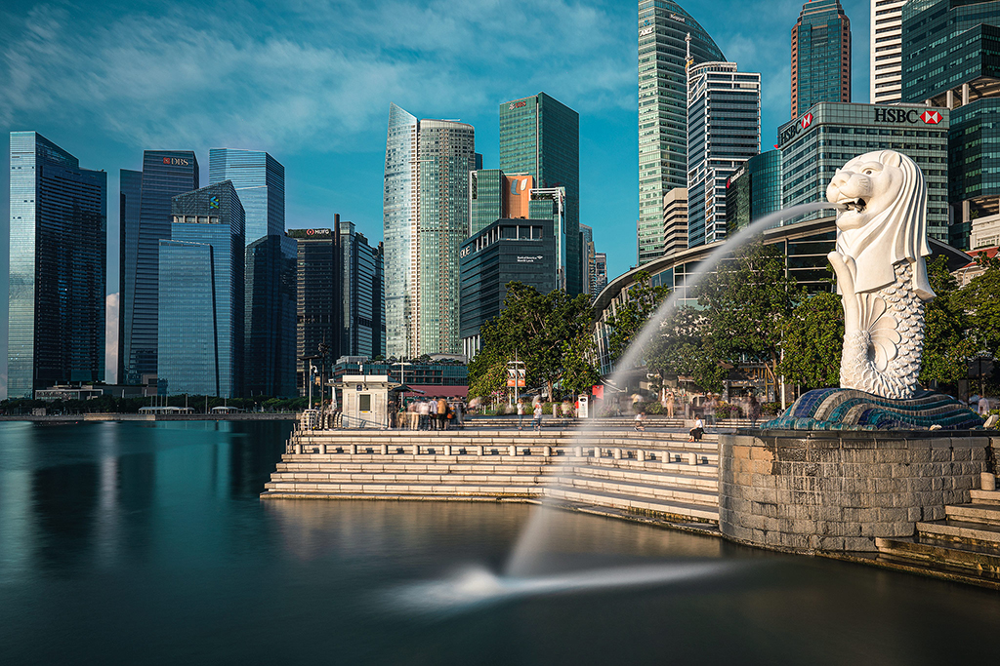

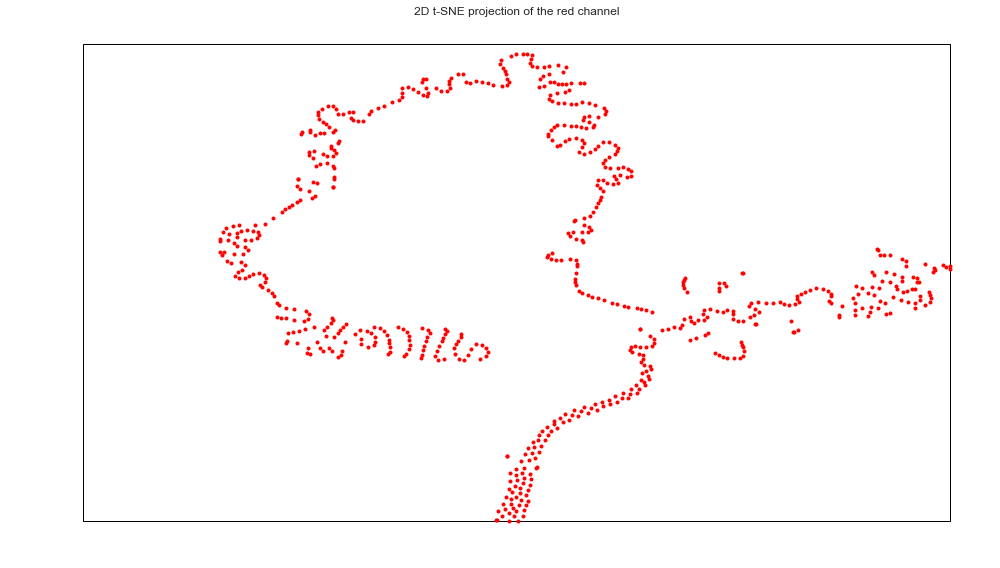

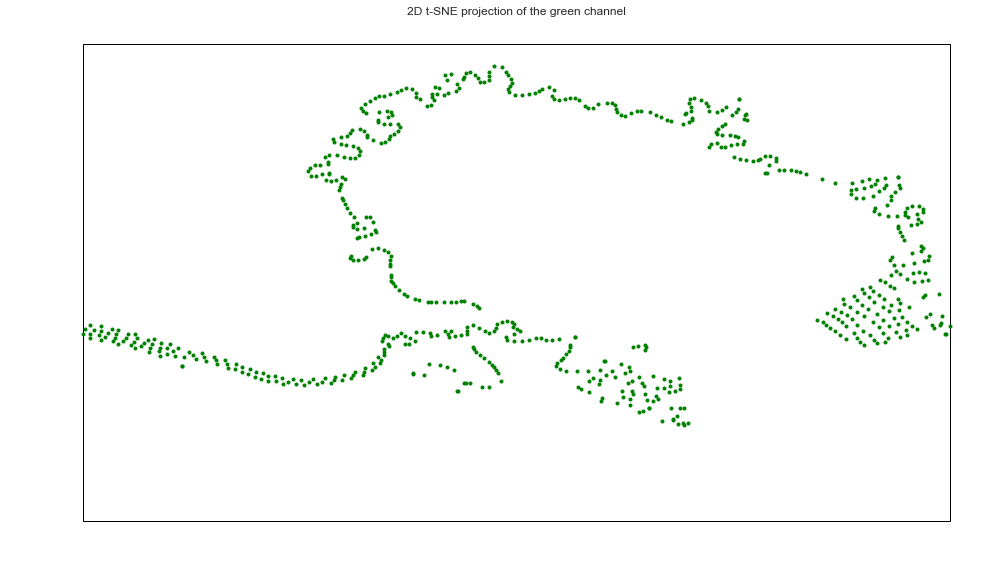

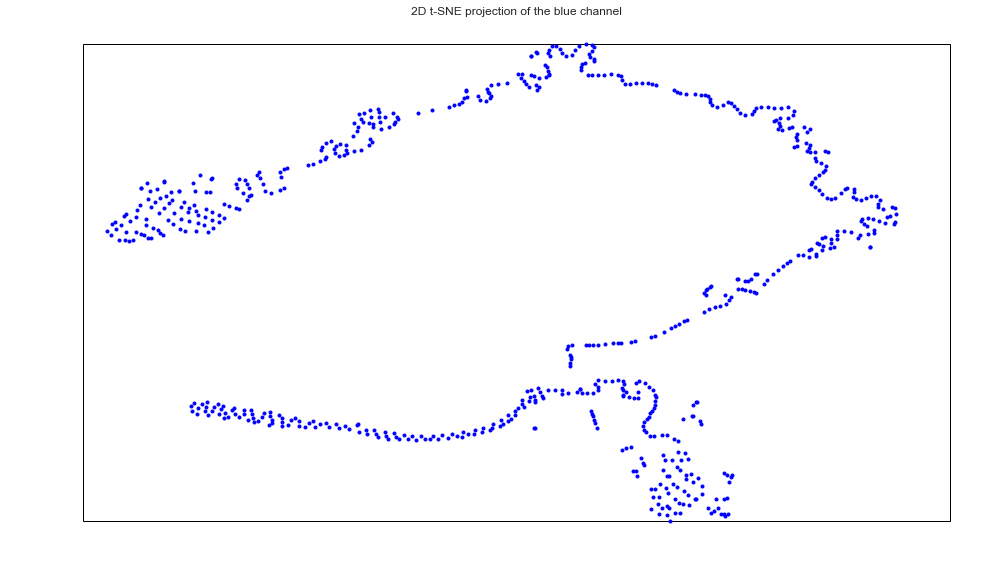

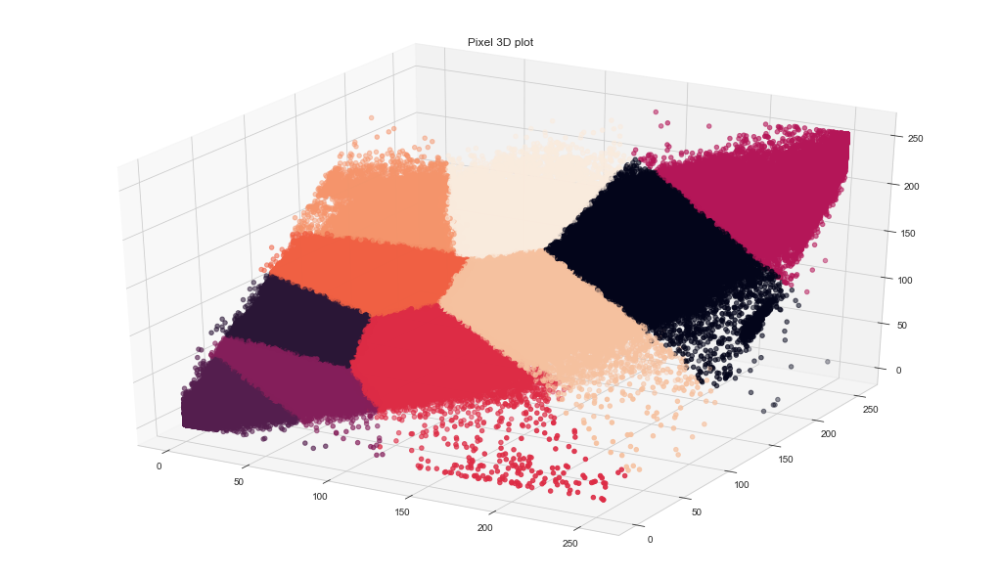

[42.97226151 44.08528562 31.74971134]
[23.83365822 21.15169869 12.40405412]
[75.42801508 67.25565177 36.88758614]
[66.51257328 84.37961992 91.37513105]
[107.30495104 124.00360934 133.31405815]
[170.82158196 144.55995739  52.92712455]
[122.05821689 107.99989441  56.40633909]
[180.18949061 159.98981936  94.55922797]
[151.86667352 170.27896414 181.49850992]
[201.24897734 223.28313298 238.48934675]


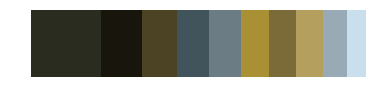

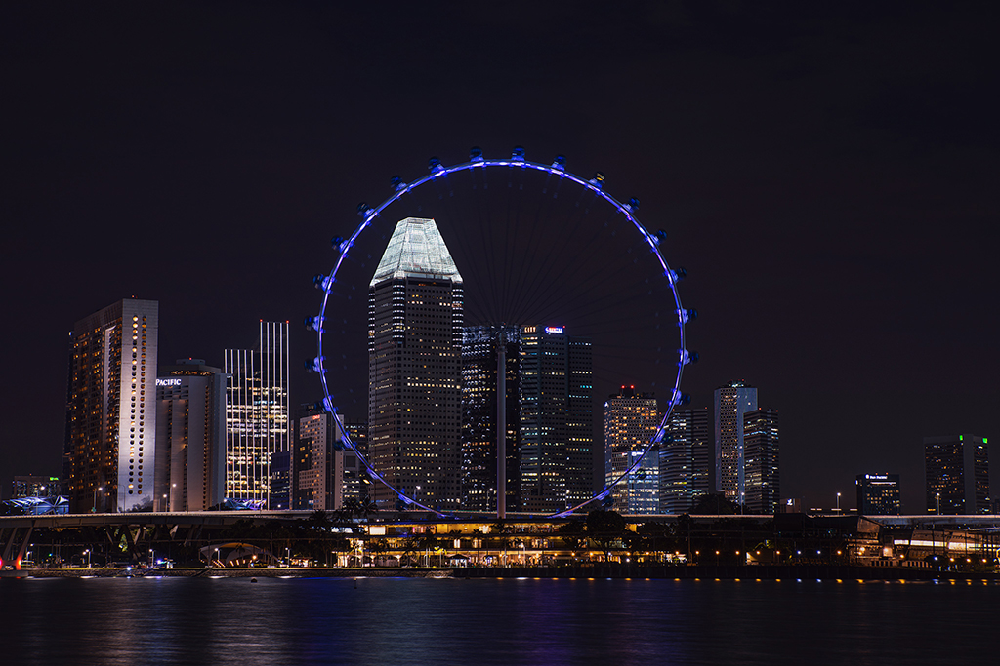

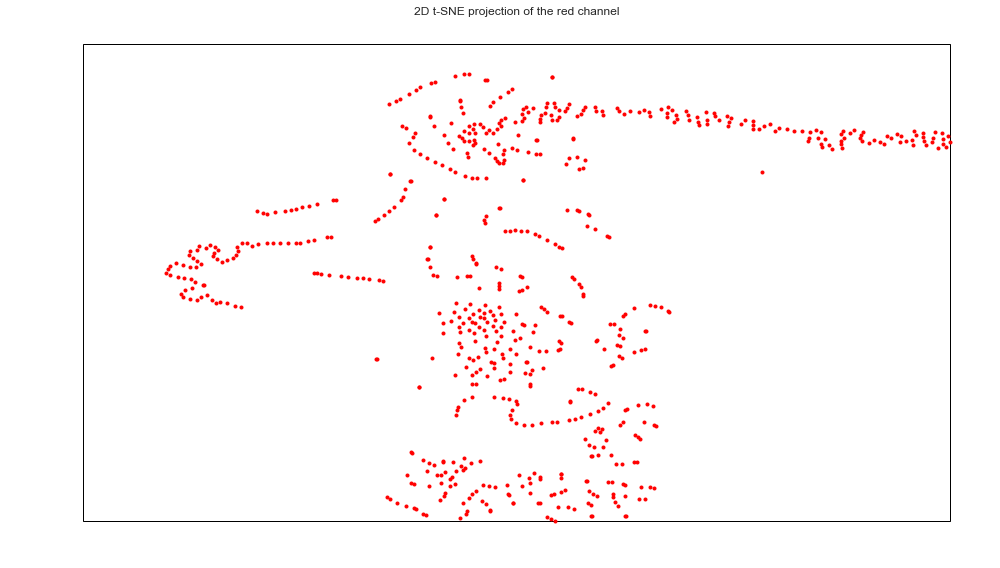

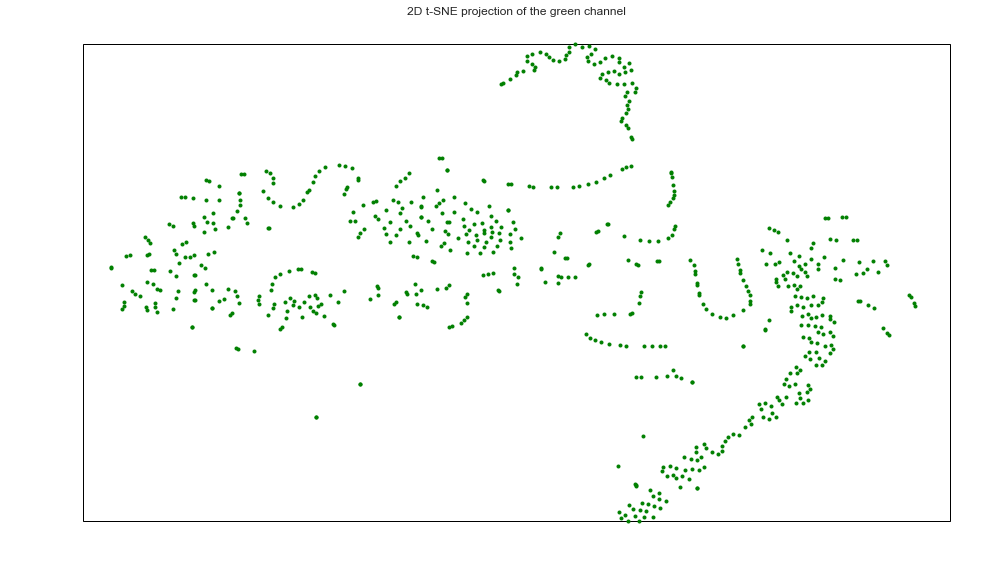

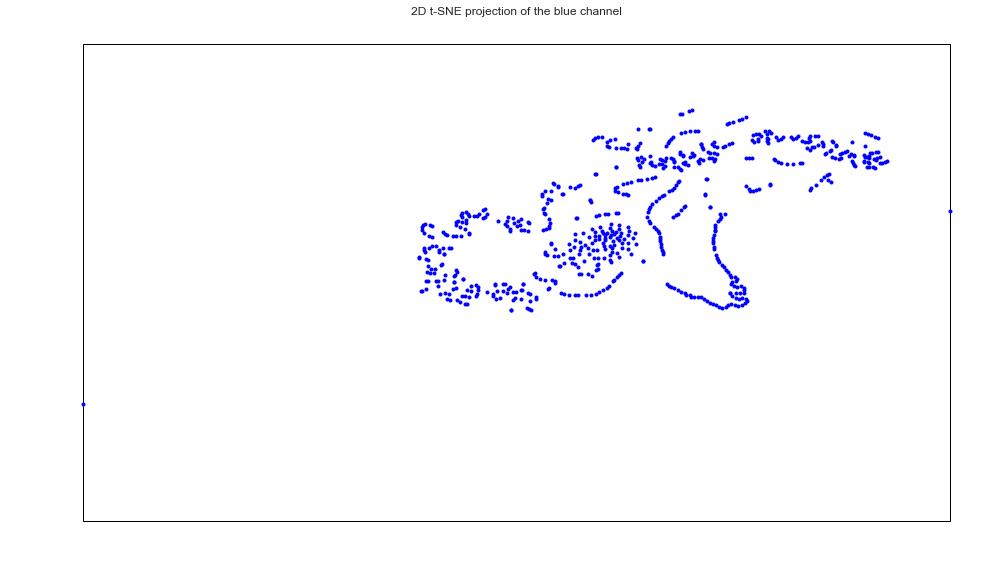

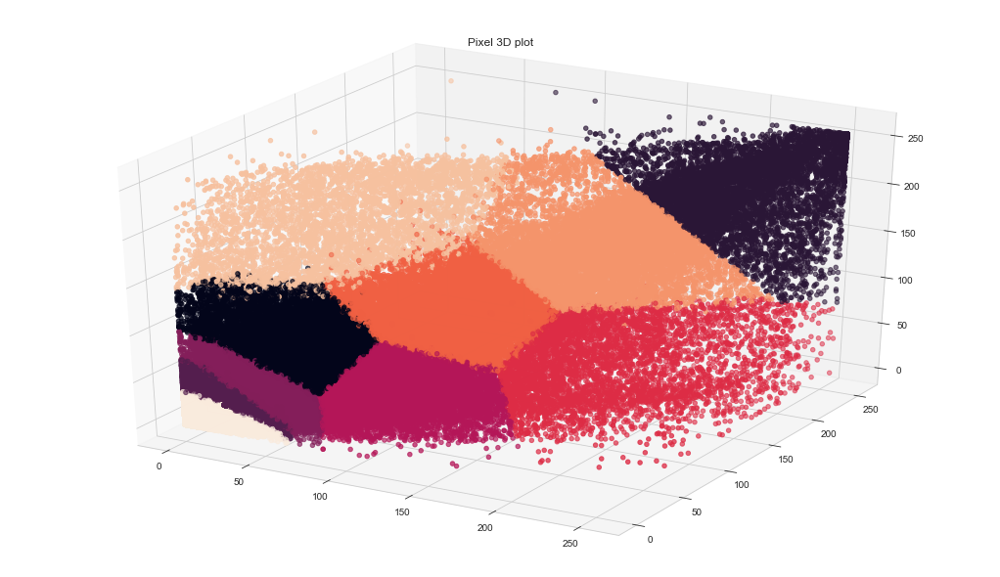

[26.56608349 16.80245943 19.81284721]
[34.83517385 23.31052451 28.22362657]
[12.6889143   8.16273537 12.32071261]
[63.85806003 44.8122378  48.33760575]
[39.67207504 57.09037901 89.89922677]
[103.83422205  91.50274572 105.85125348]
[160.94150011 150.21244105 167.16943634]
[209.6026142  210.26856219 219.91780084]
[ 54.58074283 127.12636254 188.50968914]
[198.52349159  67.84569733  60.74431256]


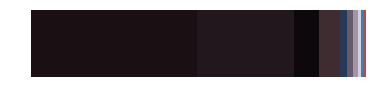

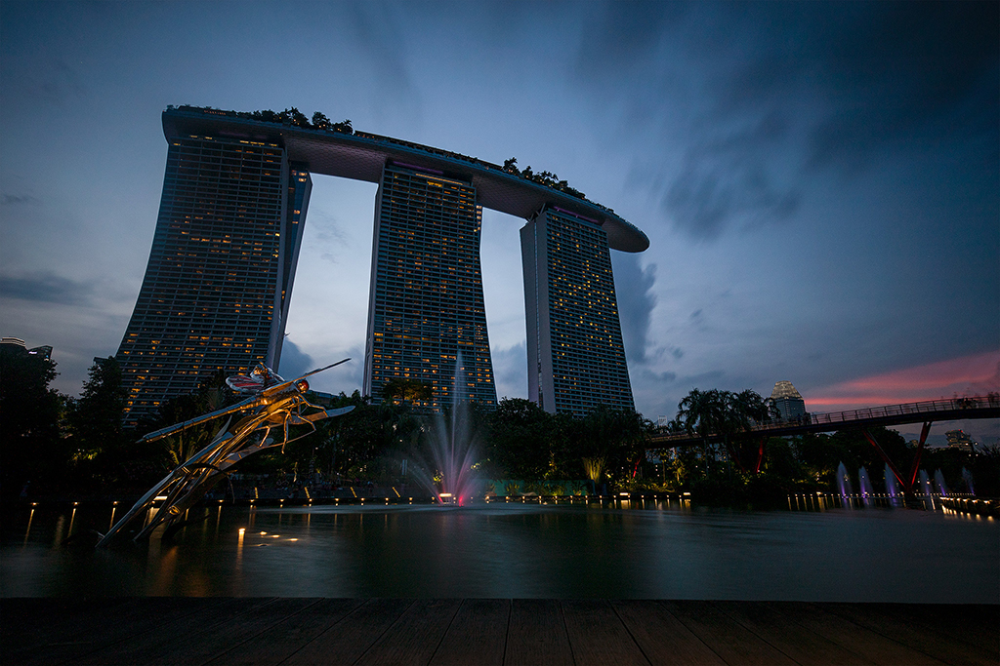

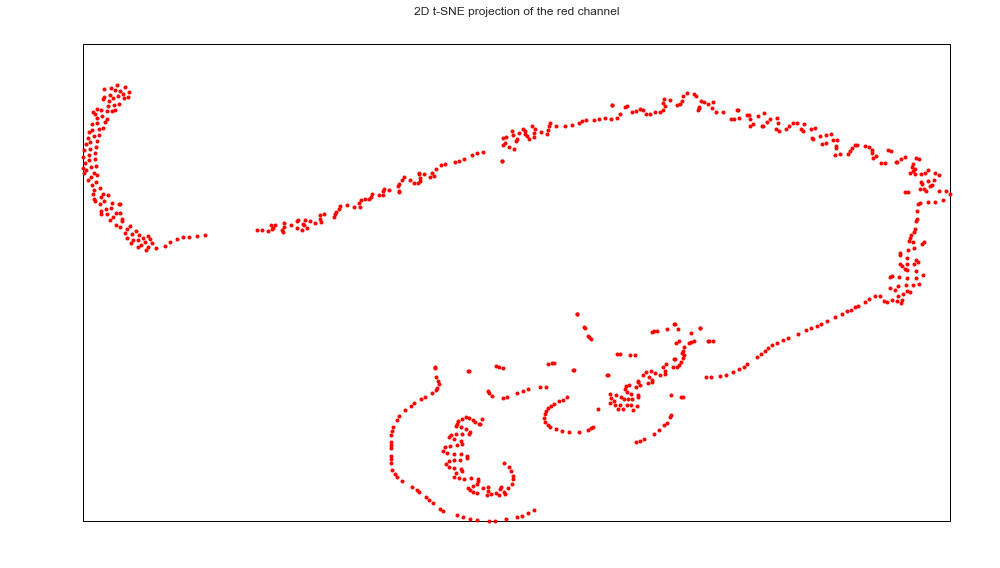

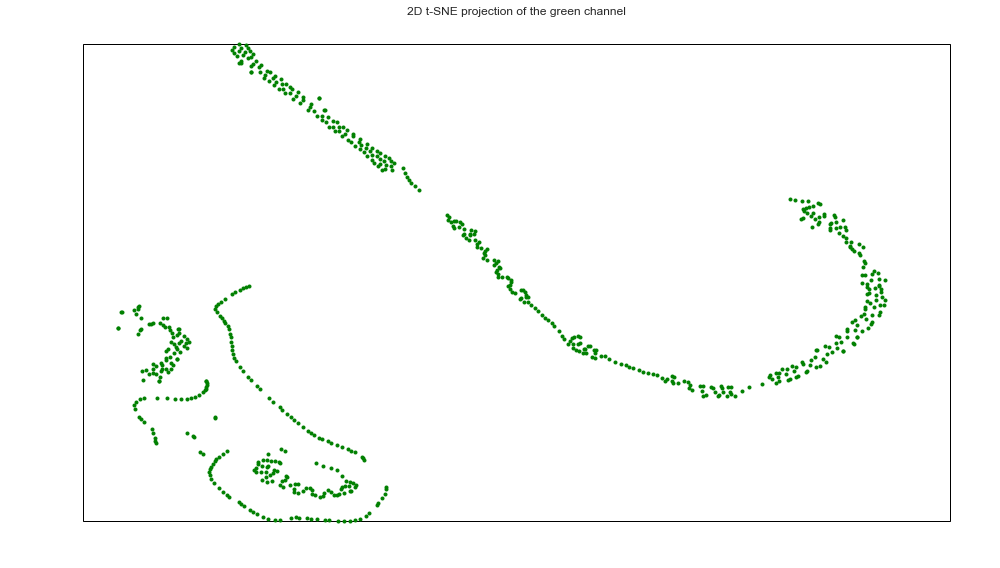

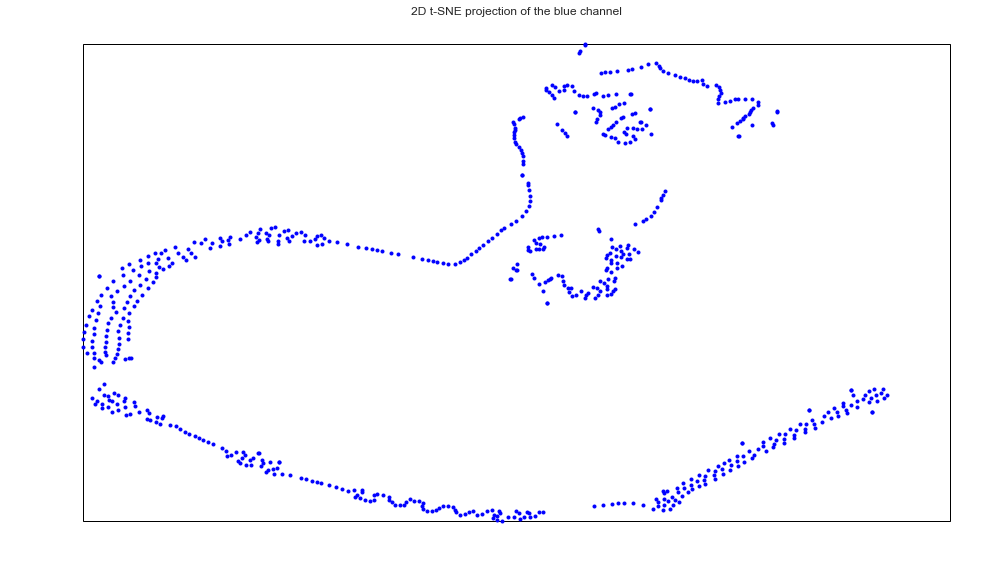

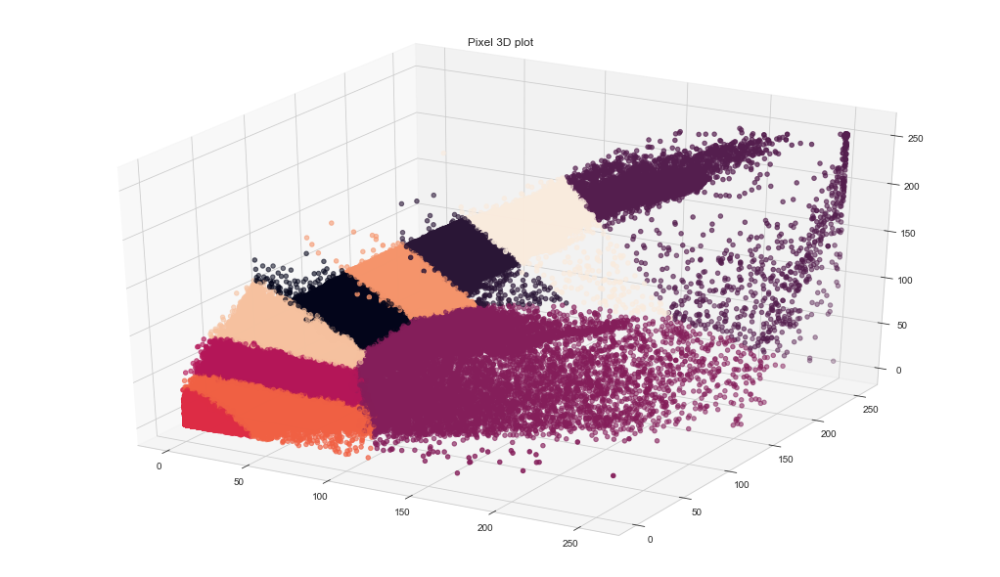

[5.92057459 7.07664621 4.65770855]
[22.21255608 22.77729379 20.31885456]
[48.09402527 37.66966888 22.85639977]
[133.09104266 100.22174285  69.73988192]
[80.42897701 56.907494   27.41705888]
[155.24057269 122.43037366  93.12354336]
[108.33236462  78.29880866  49.6584657 ]
[178.77128327 145.37444412 118.8022988 ]
[208.86973345 191.27606406 175.97592433]
[ 62.432734    78.94433818 118.82855139]


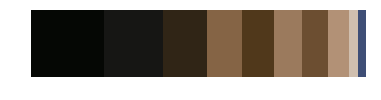

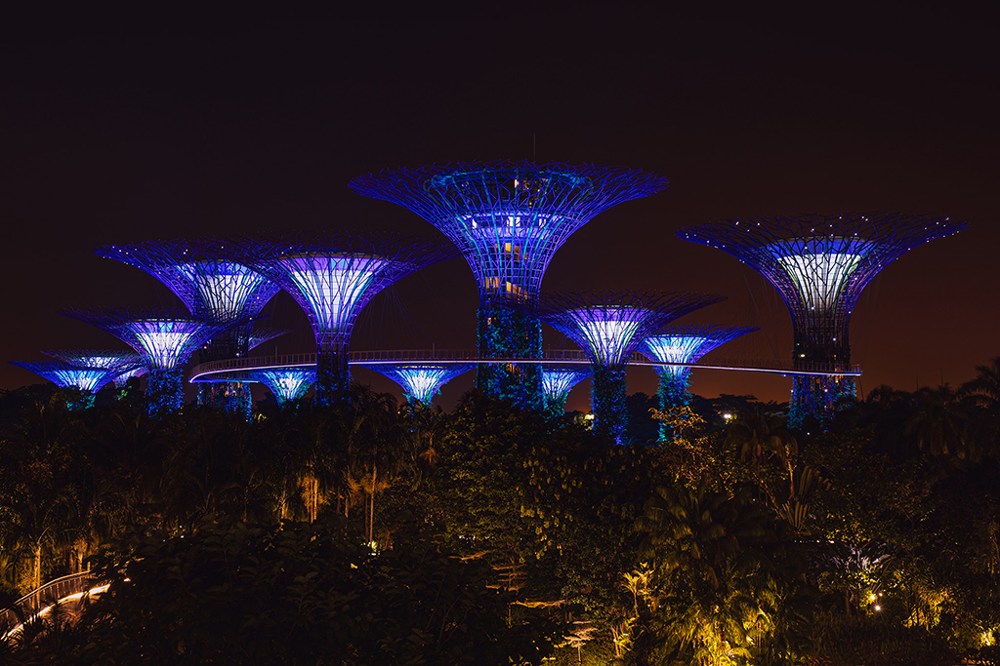

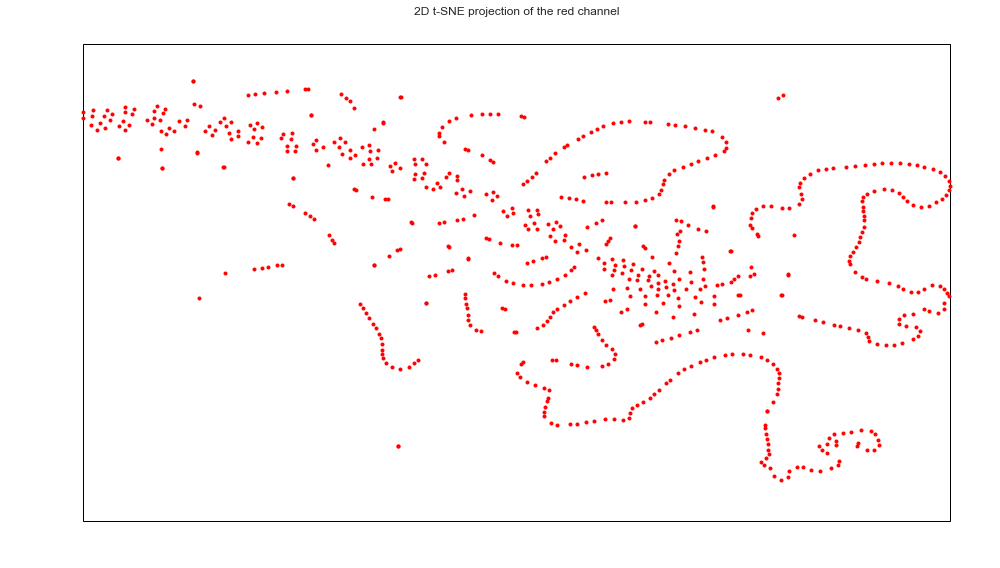

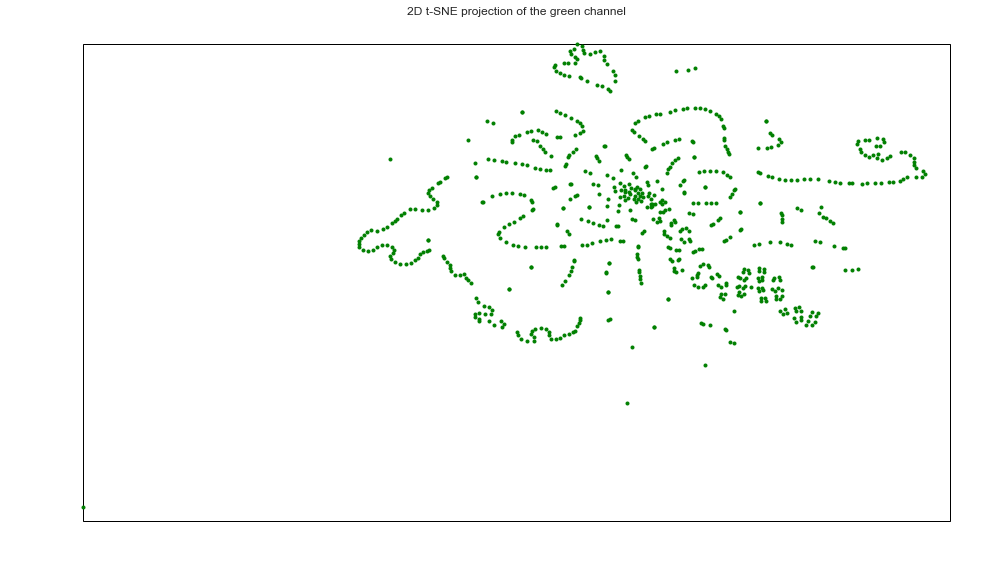

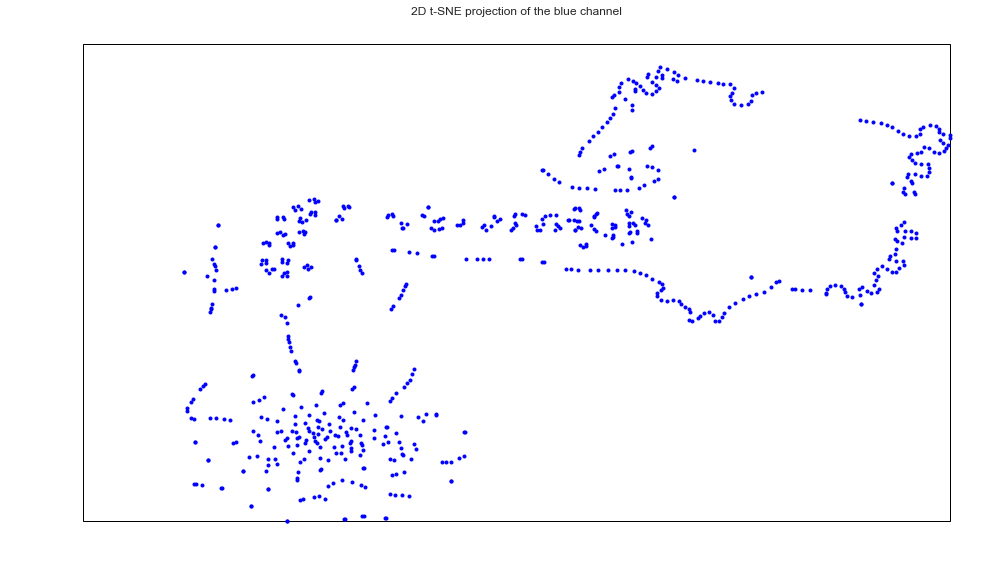

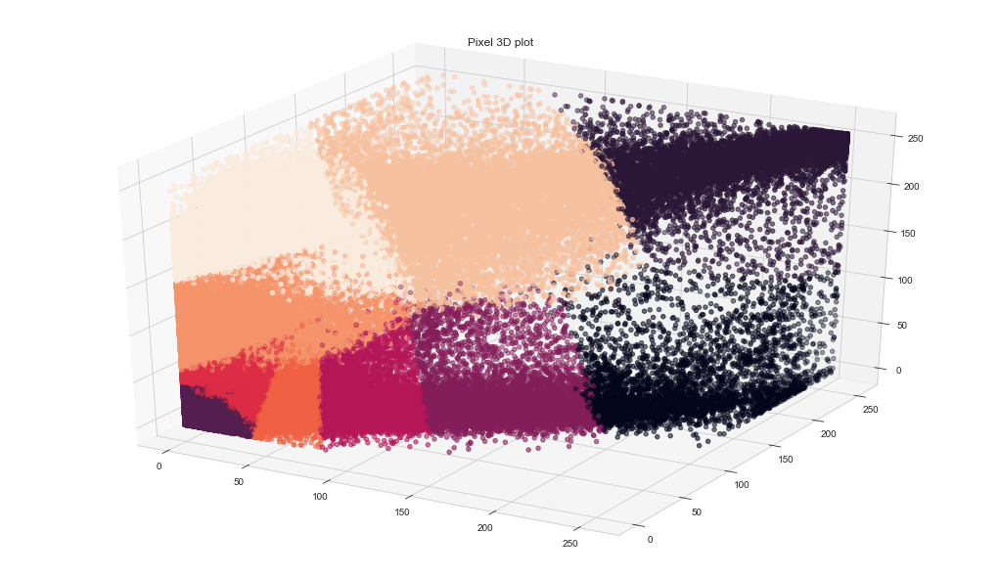

[21.06558514 15.42764132 25.63982378]
[12.13429148 10.72563262 16.78935873]
[17.01059559 24.41725463 45.84234344]
[96.08216489 22.3022995  20.88194055]
[15.92963984 46.5283279  79.62513579]
[187.70589893  40.82547436  34.61774375]
[208.03404216 119.52079836 108.30003731]
[ 20.96872077  86.39748519 136.92694586]
[232.64134276 216.80413932 216.93816254]
[ 31.90138822 155.59956917 215.89731929]


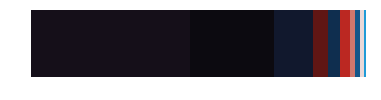

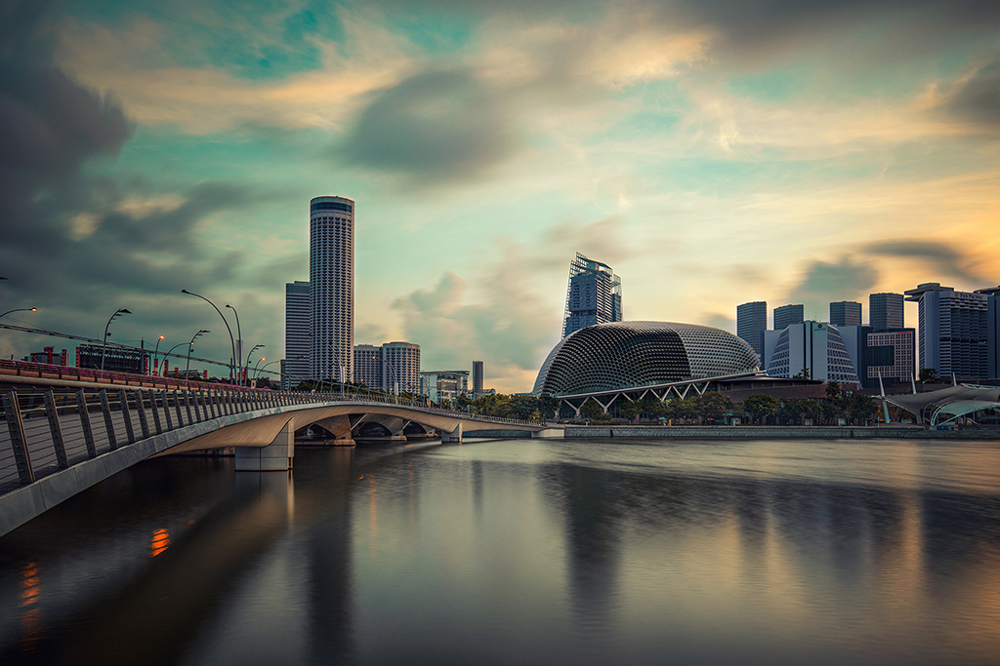

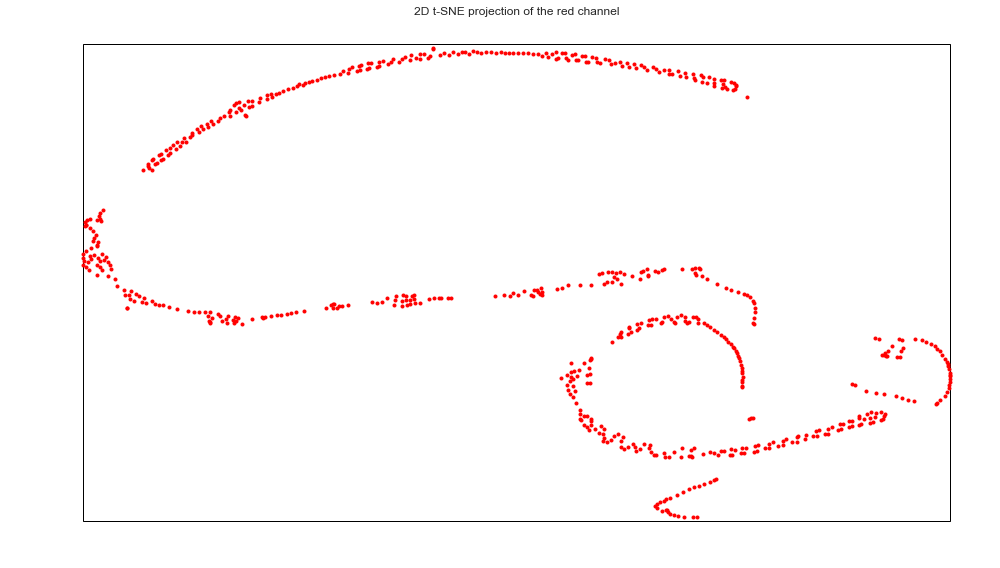

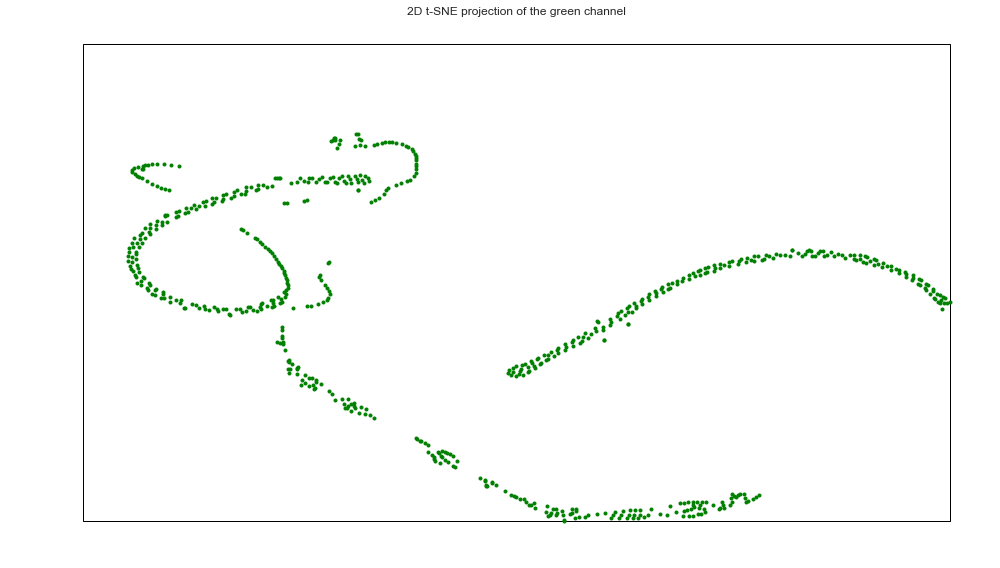

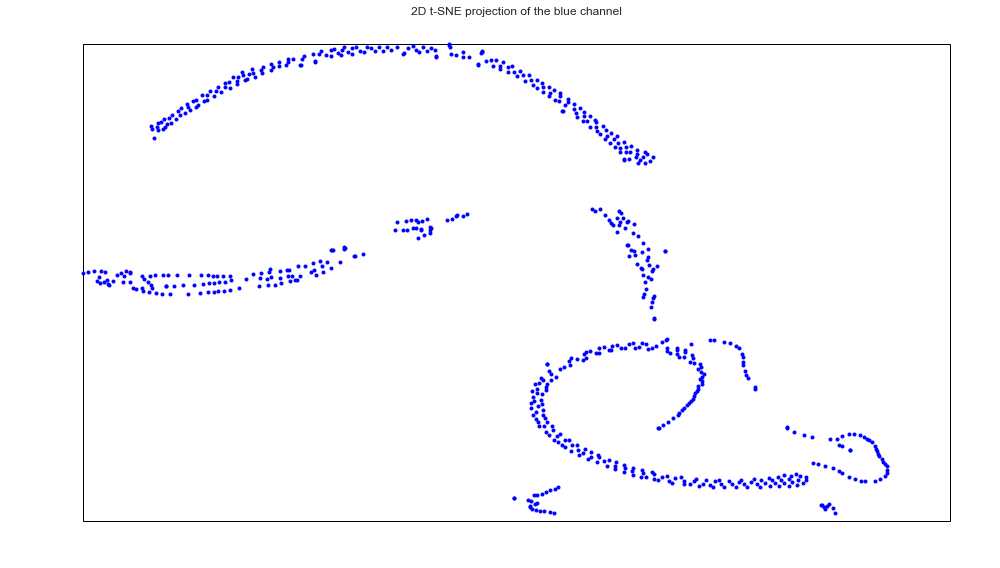

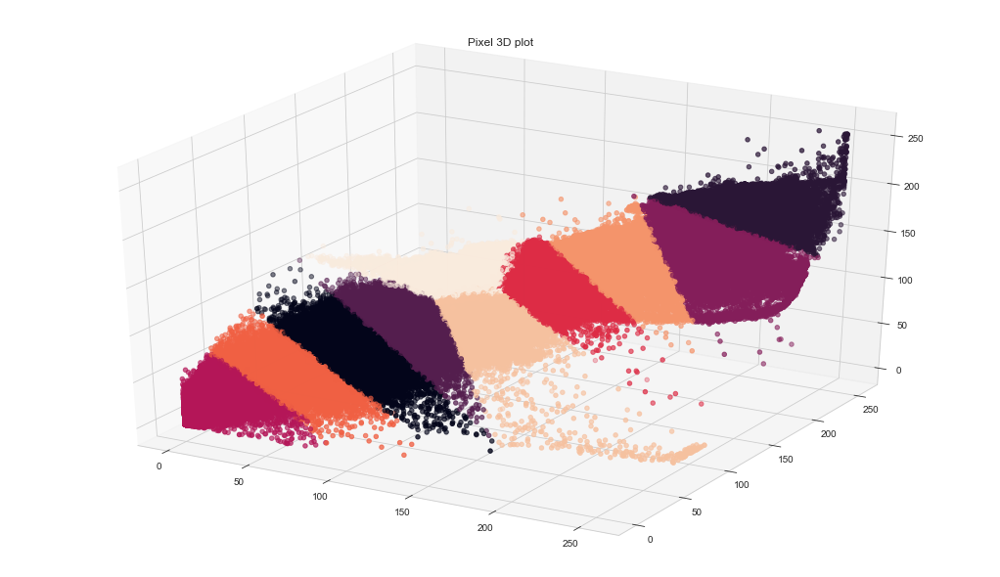

[68.24466909 65.63409677 63.14630653]
[85.84524856 89.81483934 85.39276297]
[118.82348474 141.14708972 139.80533583]
[45.53270942 41.59947833 40.76982161]
[187.10818381 219.25963261 219.07735946]
[21.12426504 17.4893001  17.98200269]
[139.98651507 168.2367717  165.98455532]
[ 95.73024422 110.85308103 116.52204432]
[154.36171104 194.13561983 208.07709082]
[118.77888818 131.12748613  96.60116388]


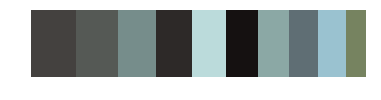

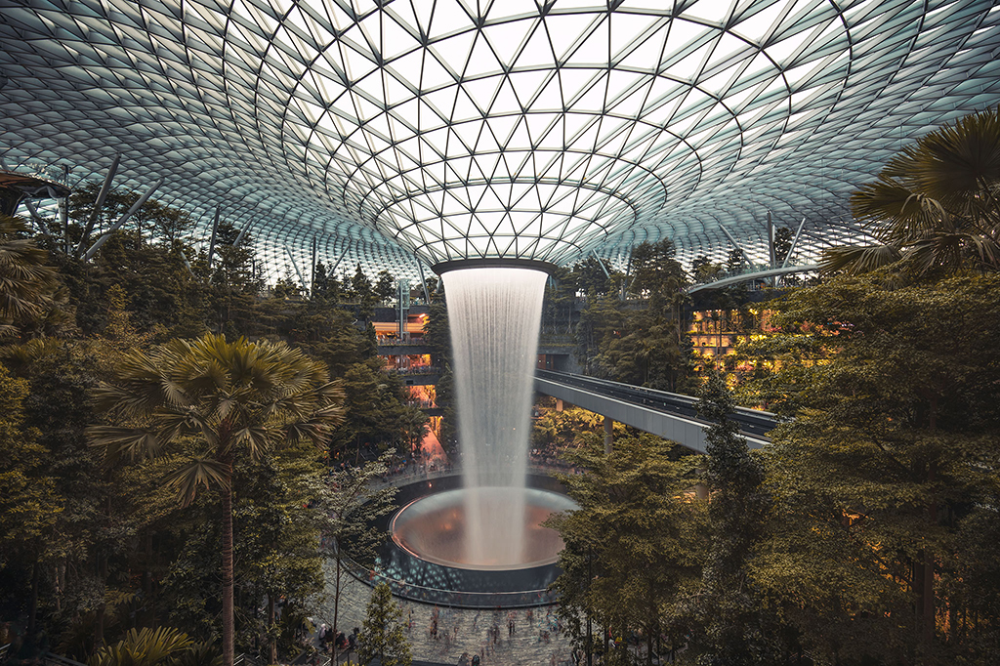

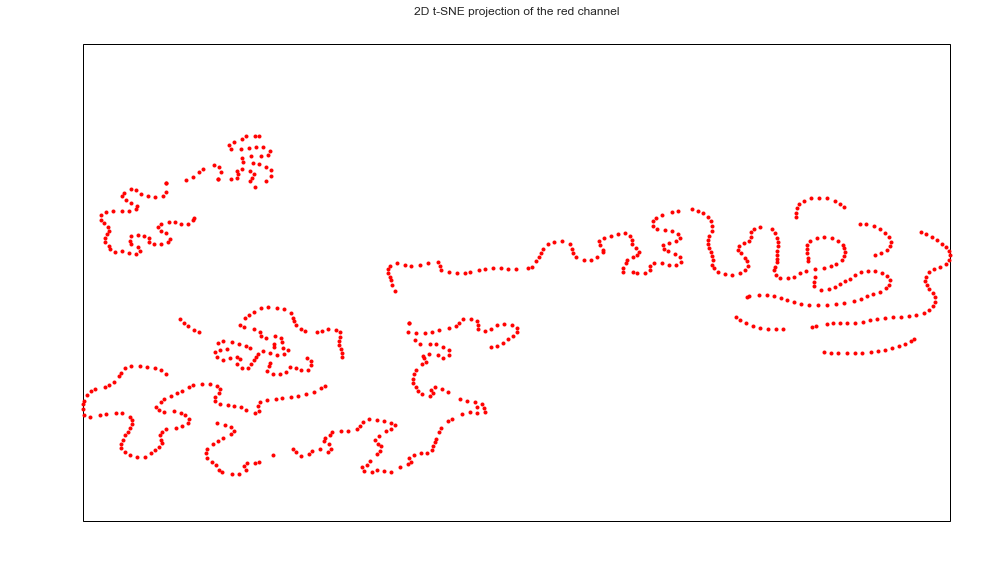

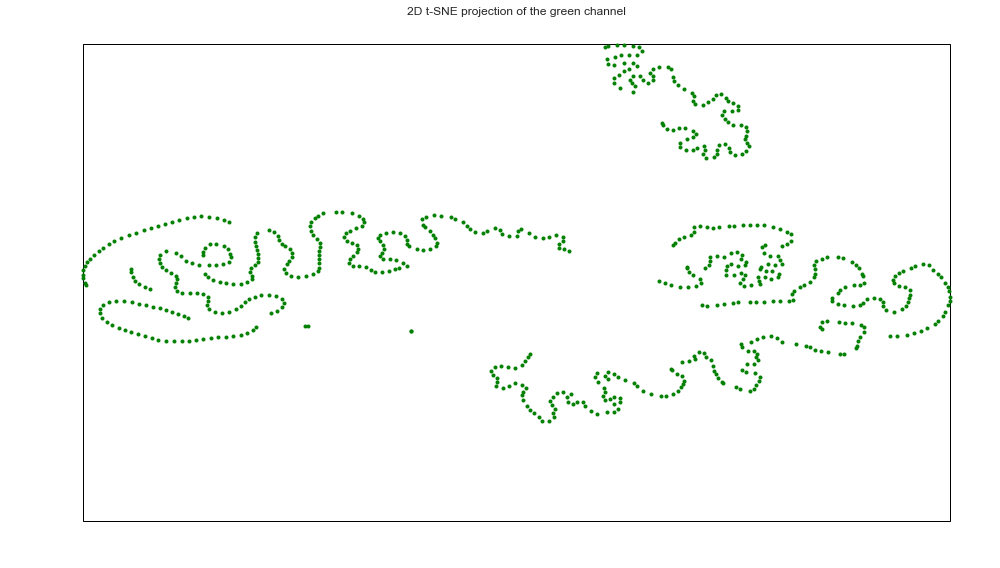

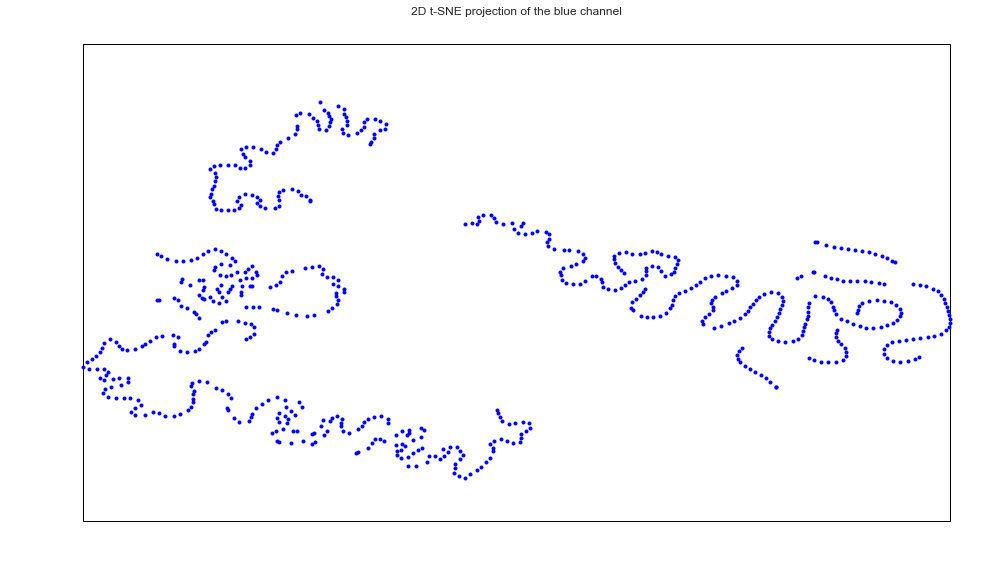

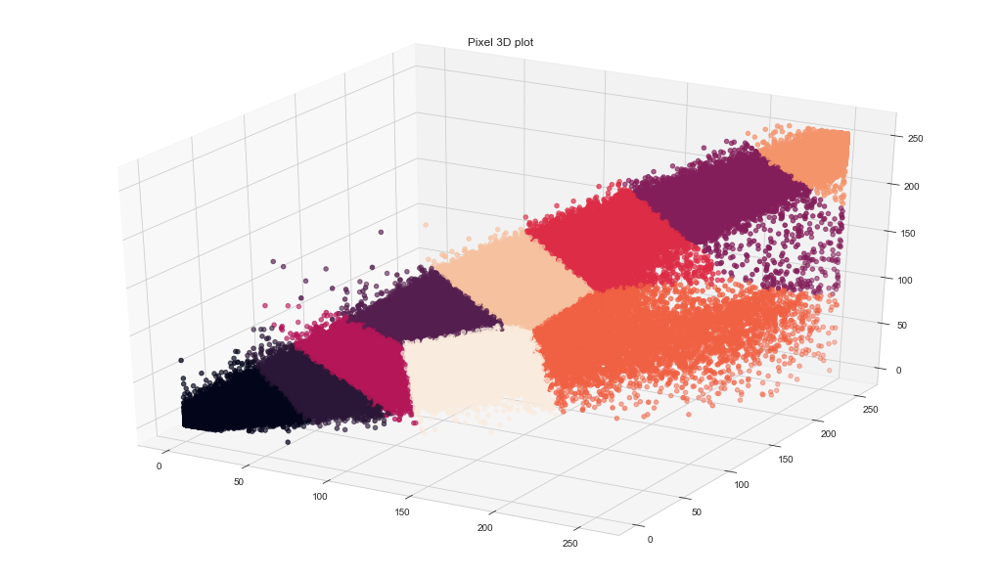

[21.42481163 25.33009716 28.60615014]
[34.89385264 43.56155732 49.10816278]
[55.28904318 64.79560887 69.75051332]
[249.21018212 250.14134934 251.50215232]
[95.93169963 96.03832671 92.41996679]
[126.80125642 131.17334856 124.98343804]
[159.00540585 165.96220016 160.50214795]
[199.65283307 209.16468479 207.11551138]
[ 59.21167298  91.2031021  108.79371838]
[ 80.87203225 140.68657608 188.15350157]


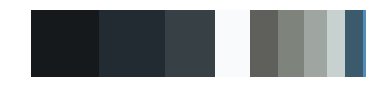

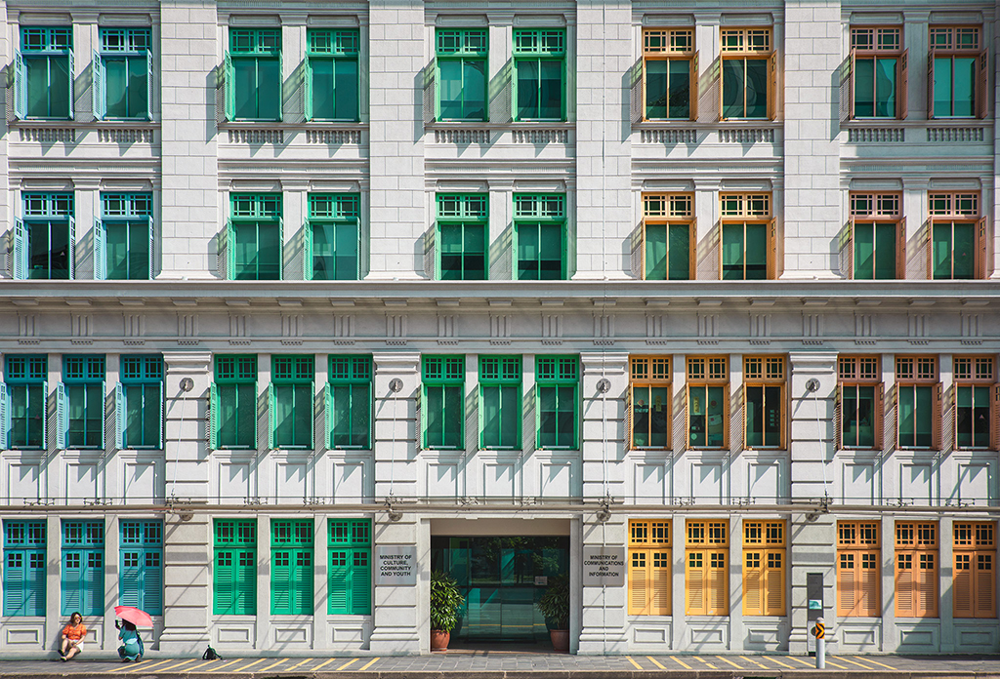

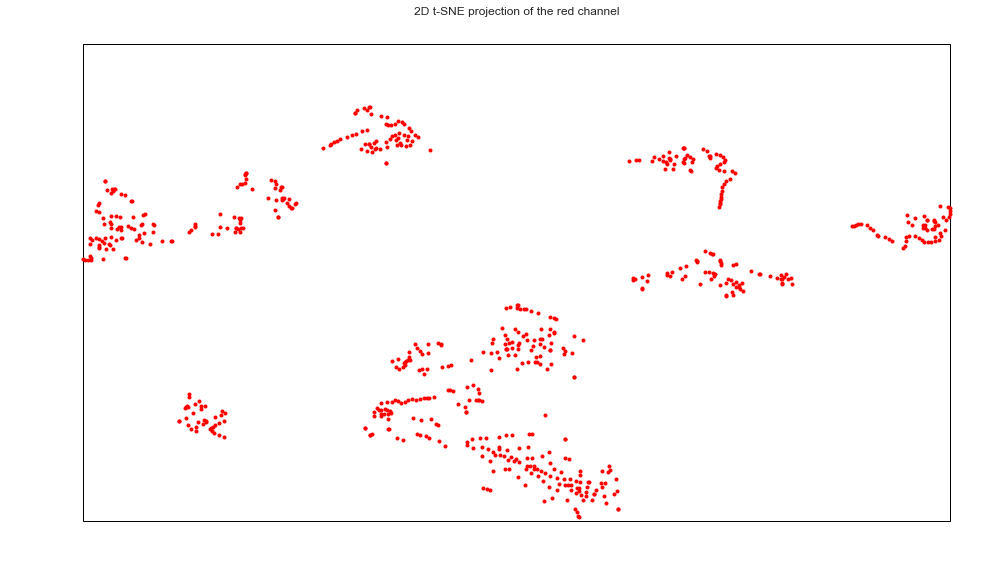

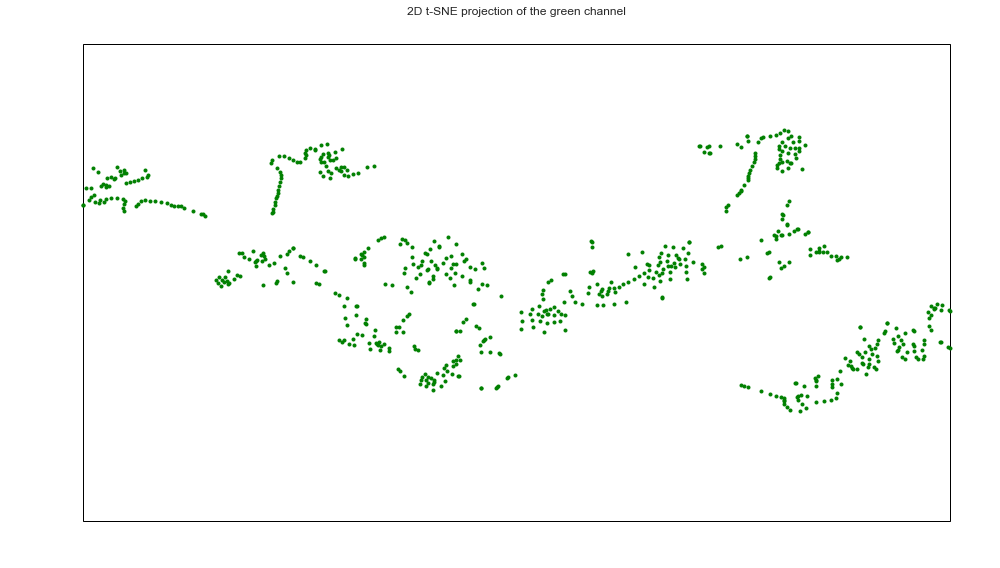

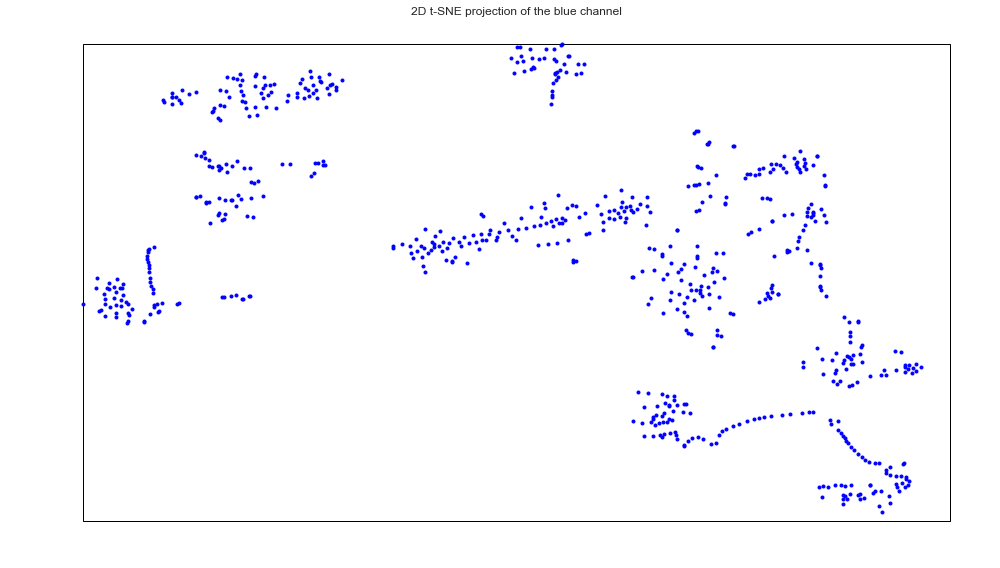

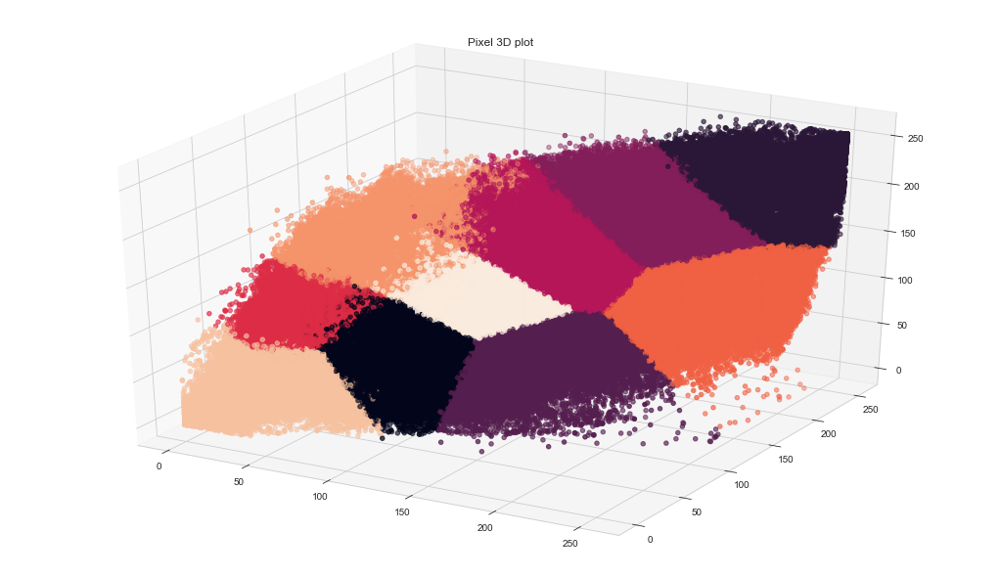

[217.45434809 220.69827781 222.41513606]
[147.58716366 149.24075578 138.41761861]
[110.48786525 114.56307319 112.15668478]
[35.31370464 40.54340122 24.79597067]
[70.1189003  79.63889748 87.63708339]
[75.24750688 86.96617643 21.73160122]
[182.04473641 189.01865256 181.06346328]
[126.20103574 144.11566792  31.46154588]
[ 57.99029454 103.27276678 153.44432641]
[107.52434111 171.93962613 226.4265143 ]


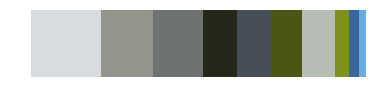

In [38]:
get_leading_colors('/Users/juande/Desktop/Images/Singapore/')